In [5]:
import tensorflow as tf
from tensorflow import lite
from tensorflow.keras import layers
import numpy as np
import pandas as pd
import random, os
import shutil
import matplotlib.pyplot as plt
from matplotlib.image import imread
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.metrics import categorical_accuracy
from sklearn.model_selection import train_test_split

In [6]:
sdir='/kaggle/input/honeycombing-dataset/Honeycombs.v1i.yolov8'
classlist=os.listdir(sdir)    
filepaths=[]
labels=[]    
for klass in classlist:
    classpath=os.path.join(sdir,klass)
    if os.path.isdir(classpath):
        flist=os.listdir(classpath)        
        for f in flist:
            fpath=os.path.join(classpath,f)        
            filepaths.append(fpath)
            labels.append(klass)
Fseries=pd.Series(filepaths, name='filepaths')
Lseries=pd.Series(labels, name='labels')    
df=pd.concat([Fseries, Lseries], axis=1)    
print (df.head())
print('df length: ', len(df))
print (df['labels'].value_counts())

                                           filepaths labels
0  /kaggle/input/honeycombing-dataset/Honeycombs....  valid
1  /kaggle/input/honeycombing-dataset/Honeycombs....  valid
2  /kaggle/input/honeycombing-dataset/Honeycombs....  valid
3  /kaggle/input/honeycombing-dataset/Honeycombs....   test
4  /kaggle/input/honeycombing-dataset/Honeycombs....   test
df length:  9
labels
valid    3
test     3
train    3
Name: count, dtype: int64


In [7]:
import cv2
import matplotlib.pyplot as plt

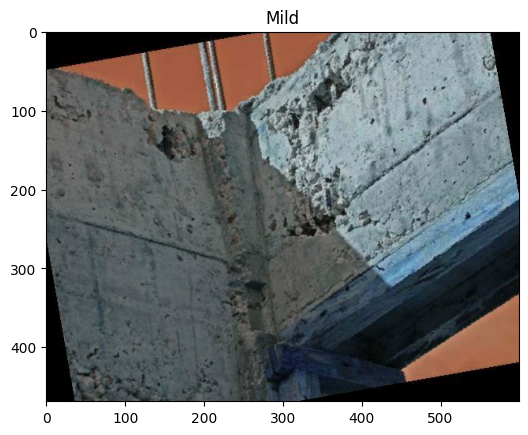

In [8]:
img1 = cv2.imread("/kaggle/input/honeycombing-dataset/Honeycombs.v1i.yolov8/train/HC/1001_jpg.rf.b78bbca03609f0c9ad49d724d4d27d66.jpg")
plt.imshow(img1)
plt.title("Mild")
plt.show()

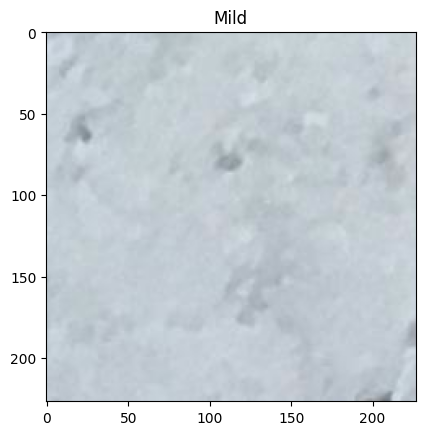

In [9]:
img1 = cv2.imread("/kaggle/input/honeycombing-dataset/Honeycombs.v1i.yolov8/train/No HC/00002.jpg")
plt.imshow(img1)
plt.title("Mild")
plt.show()

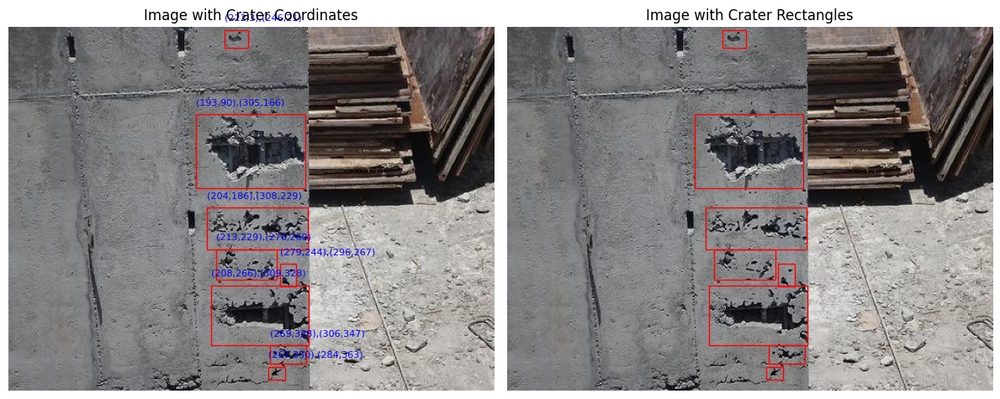

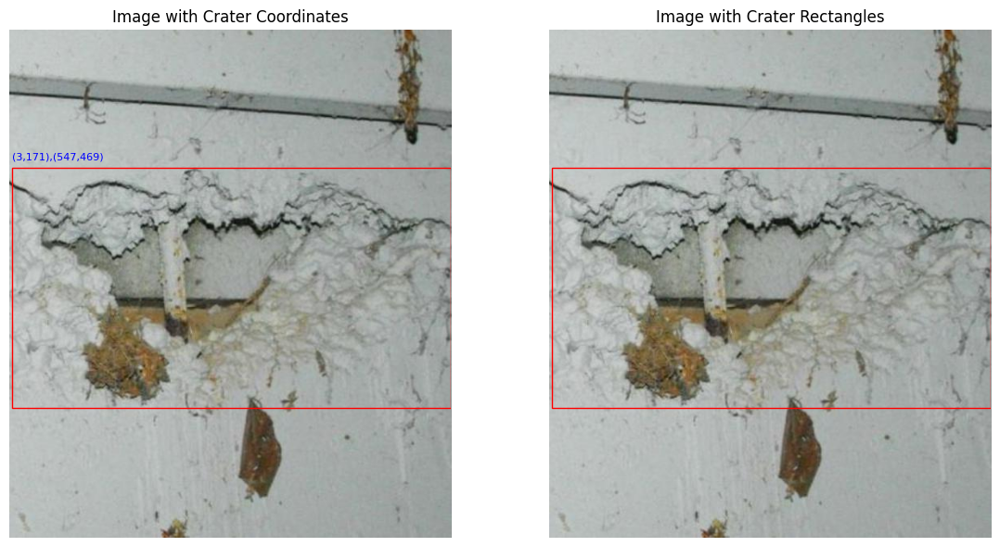

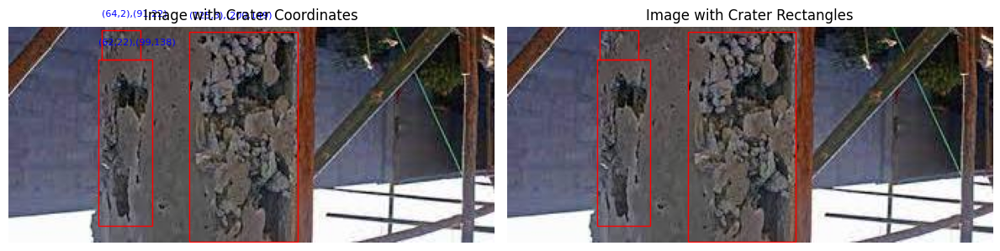

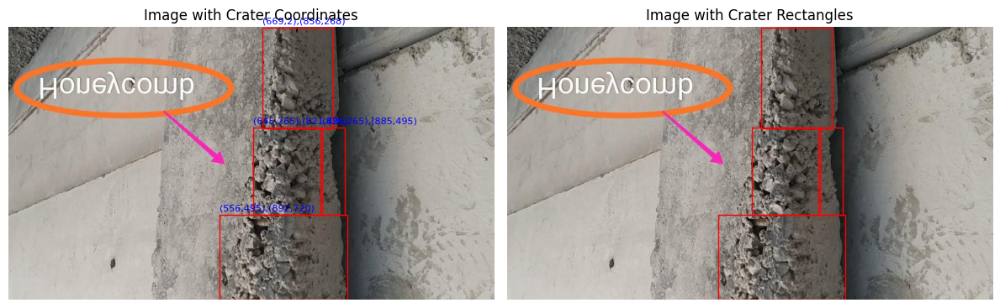

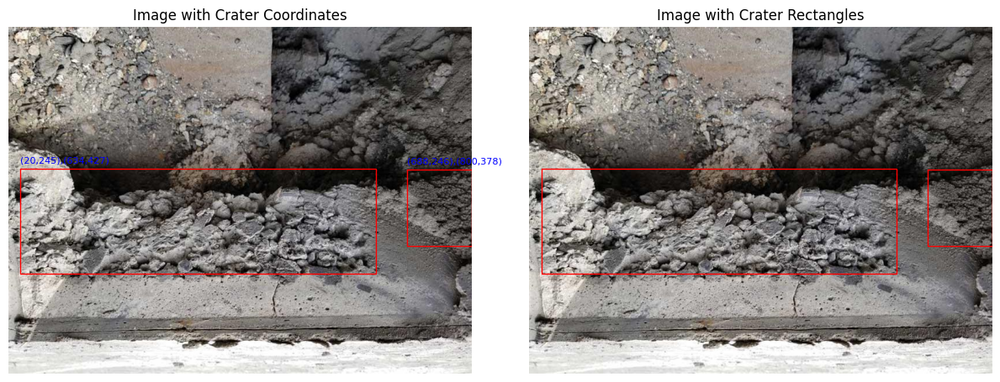

In [10]:
import cv2
import random
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def parse_labels_from_file(file_path):
    labels = []
    with open(file_path, 'r') as file:
        for line in file:
            label_parts = line.strip().split()
            if len(label_parts) == 5:
                class_id, x, y, w, h = map(float, label_parts)
                labels.append((int(class_id), x, y, w, h))
    return labels

# Function to convert label coordinates from YOLO format to pixel values
def yolo_to_pixels(image_width, image_height, box):
    x, y, w, h = box
    xmin = int((x - w / 2) * image_width)
    xmax = int((x + w / 2) * image_width)
    ymin = int((y - h / 2) * image_height)
    ymax = int((y + h / 2) * image_height)
    return xmin, ymin, xmax, ymax

# Function to display image with labeled objects in YOLO format
def display_image_with_labels(image_path, labels):
    # Load the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_height, image_width, _ = image.shape

    # Create figure and axes for two different plots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    ax1.imshow(image_rgb)
    ax2.imshow(image_rgb)

    # Add rectangles with calculated coordinates
    for label in labels:
        class_id, x, y, w, h = label

        # Convert YOLO coordinates to pixel values
        xmin, ymin, xmax, ymax = yolo_to_pixels(image_width, image_height, (x, y, w, h))

        # Create a rectangle patch
        rect1 = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
        rect2 = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')

        # Add the rectangle patch to the axes
        ax1.add_patch(rect1)
        ax2.add_patch(rect2)

        # Add coordinate text above the rectangle in the first plot
        ax1.text(xmin, ymin - 10, f'({xmin},{ymin}),({xmax},{ymax})', fontsize=8, color='b')

    # Set plot titles
    ax1.set_title('Image with Crater Coordinates')
    ax2.set_title('Image with Crater Rectangles')

    # Show the plots
    ax1.axis('off')
    ax2.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage

img_path = '/kaggle/input/honeycombing-dataset/Honeycombs.v1i.yolov8/test/HC'
labels_path = '/kaggle/input/honeycombing-dataset/Honeycombs.v1i.yolov8/test/labels'

for j in range(5):
    random_img = random.choice(os.listdir(img_path))
    final_path_img = os.path.join(img_path, random_img)
    labels_file_path = os.path.join(labels_path, f"{random_img.rsplit('.', 1)[0]}.txt")
    
    labels = parse_labels_from_file(labels_file_path)

    # Display the image with labels
    display_image_with_labels(final_path_img, labels)

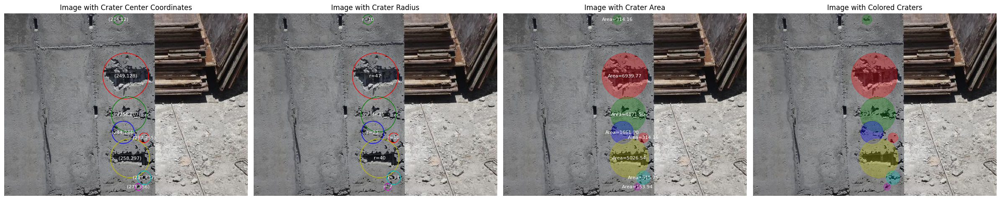

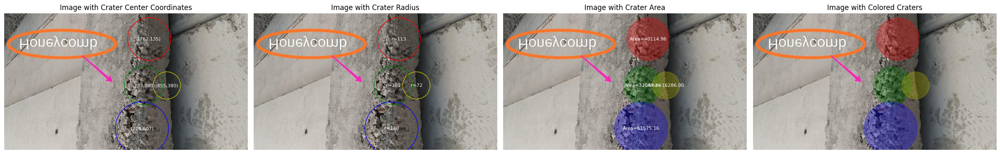

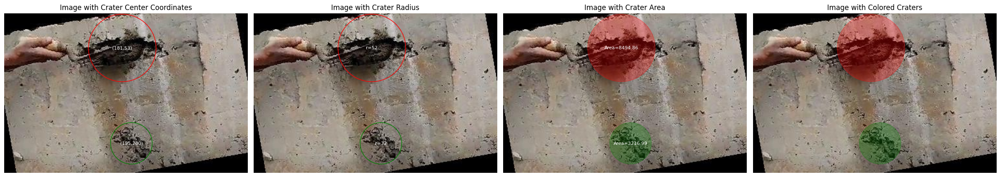

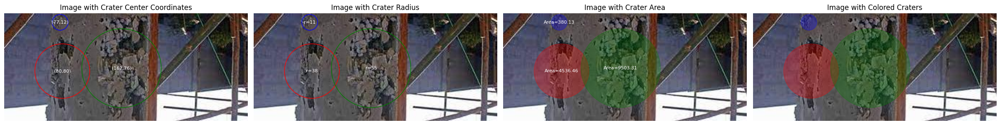

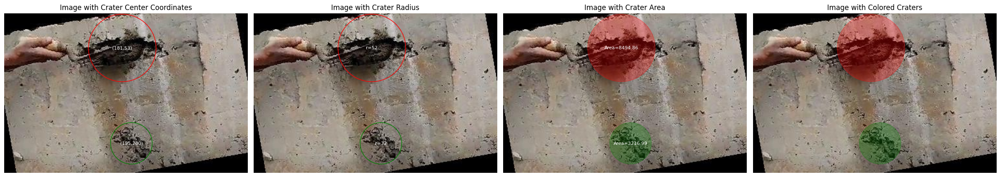

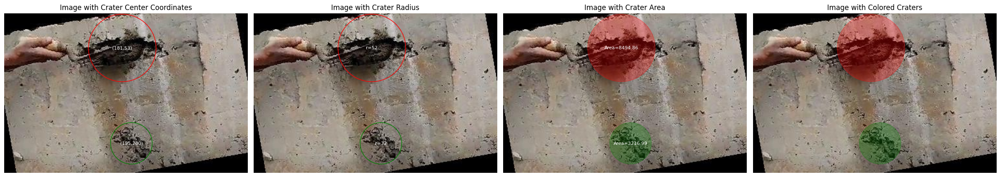

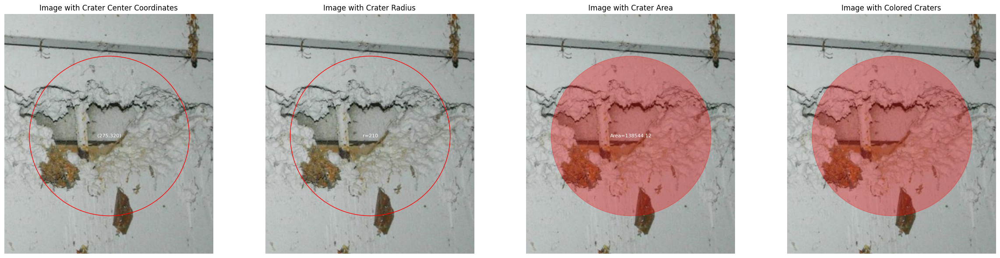

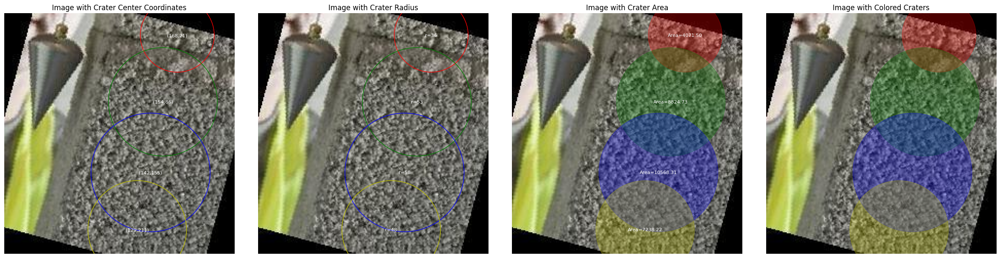

In [11]:
import cv2
import random
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def parse_labels_from_file(file_path):
    labels = []
    with open(file_path, 'r') as file:
        for line in file:
            label_parts = line.strip().split()
            if len(label_parts) == 5:
                class_id, x, y, w, h = map(float, label_parts)
                labels.append((int(class_id), x, y, w, h))
    return labels

# Function to convert label coordinates from YOLO format to pixel values
def yolo_to_pixels(image_width, image_height, box):
    x, y, w, h = box
    xmin = int((x - w / 2) * image_width)
    xmax = int((x + w / 2) * image_width)
    ymin = int((y - h / 2) * image_height)
    ymax = int((y + h / 2) * image_height)
    return xmin, ymin, xmax, ymax

# Function to display image with labeled objects in YOLO format
def display_image_with_labels(image_path, labels):
    # Load the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_height, image_width, _ = image.shape

    # Create figure and axes for four different plots side by side
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 6))
    
    ax1.imshow(image_rgb)
    ax2.imshow(image_rgb)
    ax3.imshow(image_rgb)
    ax4.imshow(image_rgb)

    ax1.set_facecolor('black')
    ax2.set_facecolor('black')
    ax3.set_facecolor('black')
    ax4.set_facecolor('black')

    colors = ['r', 'g', 'b', 'y', 'c', 'm']  # Different colors for the circles

    # Add circles with calculated center, radius, and area
    for i, label in enumerate(labels):
        class_id, x, y, w, h = label

        # Convert YOLO coordinates to pixel values
        xmin, ymin, xmax, ymax = yolo_to_pixels(image_width, image_height, (x, y, w, h))

        # Calculate the center and radius of the crater
        center_x = (xmin + xmax) // 2
        center_y = (ymin + ymax) // 2
        radius = int(((xmax - xmin) + (ymax - ymin)) / 4)
        area = 3.14159 * (radius ** 2)  # Area of the circle

        color = colors[i % len(colors)]  # Cycle through the colors

        # Create a circle patch with transparency for the area plot
        circle1 = patches.Circle((center_x, center_y), radius, linewidth=1, edgecolor=color, facecolor='none', alpha=1)
        circle2 = patches.Circle((center_x, center_y), radius, linewidth=1, edgecolor=color, facecolor='none', alpha=1)
        circle3 = patches.Circle((center_x, center_y), radius, linewidth=1, edgecolor=color, facecolor=color, alpha=0.3)
        circle4 = patches.Circle((center_x, center_y), radius, linewidth=1, edgecolor=color, facecolor=color, alpha=0.3)

        # Add the circle patch to the axes
        ax1.add_patch(circle1)
        ax2.add_patch(circle2)
        ax3.add_patch(circle3)
        ax4.add_patch(circle4)

        # Add center coordinate text inside the circle in the first plot
        ax1.text(center_x, center_y, f'({center_x},{center_y})', fontsize=8, color='w', ha='center', va='center')

        # Add radius text inside the circle in the second plot
        ax2.text(center_x, center_y, f'r={radius}', fontsize=8, color='w', ha='center', va='center')

        # Add area text inside the circle in the third plot
        ax3.text(center_x, center_y, f'Area={area:.2f}', fontsize=8, color='w', ha='center', va='center')

    # Set plot titles
    ax1.set_title('Image with Crater Center Coordinates')
    ax2.set_title('Image with Crater Radius')
    ax3.set_title('Image with Crater Area')
    ax4.set_title('Image with Colored Craters')

    # Show the plots
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    ax4.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage

img_path = '/kaggle/input/honeycombing-dataset/Honeycombs.v1i.yolov8/test/HC'
labels_path = '/kaggle/input/honeycombing-dataset/Honeycombs.v1i.yolov8/test/labels'

for j in range(8):
    random_img = random.choice(os.listdir(img_path))
    final_path_img = os.path.join(img_path, random_img)
    labels_file_path = os.path.join(labels_path, f"{random_img.rsplit('.',1)[0]}.txt")

    labels = parse_labels_from_file(labels_file_path)

    # Display the image with labels
    display_image_with_labels(final_path_img, labels)

# Code Starts

In [12]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.optim import lr_scheduler
from torchvision import datasets, models, transforms
import torchvision.transforms as transforms
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
import time
import copy
import random
import shutil
import cv2  

In [13]:
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

In [14]:
def apply_otsu_thresholding(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    _, thresh_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    thresh_image = cv2.cvtColor(thresh_image, cv2.COLOR_GRAY2RGB)
    return Image.fromarray(thresh_image)

In [15]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

data_dir = '/kaggle/input/honeycombing-without-lebel-files/Honey Combing Without lebel'
train_dir = os.path.join(data_dir, 'train')
val_dir = os.path.join(data_dir, 'valid')

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'valid': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'valid']}
dataloaders = {x: DataLoader(image_datasets[x], batch_size=32, shuffle=True, num_workers=4) for x in ['train', 'valid']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'valid']}
class_names = image_datasets['train'].classes

vgg19_model = models.vgg19(pretrained=True)
for param in vgg19_model.parameters():
    param.requires_grad = False

for param in vgg19_model.features[-4:].parameters():
    param.requires_grad = True

num_features = vgg19_model.classifier[6].in_features
vgg19_model.classifier[6] = nn.Linear(num_features, len(class_names))

vgg19_model = vgg19_model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(vgg19_model.parameters(), lr=0.0001, momentum=0.9)
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

num_epochs = 10
best_model_wts = copy.deepcopy(vgg19_model.state_dict())
best_acc = 0.0

for epoch in range(num_epochs):
    print(f'Epoch {epoch}/{num_epochs - 1}')
    print('-' * 10)

    for phase in ['train', 'valid']:
        vgg19_model.train() if phase == 'train' else vgg19_model.eval()
        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in dataloaders[phase]:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = vgg19_model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        if phase == 'train':
            scheduler.step()

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        if phase == 'valid' and epoch_acc > best_acc:
            best_acc = epoch_acc
            best_model_wts = copy.deepcopy(vgg19_model.state_dict())
# vgg19_model.load_state_dict(best_model_wts)
model = vgg19_model.load_state_dict(best_model_wts)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 194MB/s] 


Epoch 0/9
----------
train Loss: 0.4325 Acc: 0.8669
valid Loss: 0.2202 Acc: 0.9821
Epoch 1/9
----------
train Loss: 0.1767 Acc: 0.9775
valid Loss: 0.1179 Acc: 0.9895
Epoch 2/9
----------
train Loss: 0.1247 Acc: 0.9809
valid Loss: 0.0814 Acc: 0.9916
Epoch 3/9
----------
train Loss: 0.0895 Acc: 0.9843
valid Loss: 0.0624 Acc: 0.9926
Epoch 4/9
----------
train Loss: 0.0776 Acc: 0.9843
valid Loss: 0.0510 Acc: 0.9947
Epoch 5/9
----------
train Loss: 0.0709 Acc: 0.9831
valid Loss: 0.0434 Acc: 0.9947
Epoch 6/9
----------
train Loss: 0.0543 Acc: 0.9921
valid Loss: 0.0374 Acc: 0.9947
Epoch 7/9
----------
train Loss: 0.0612 Acc: 0.9860
valid Loss: 0.0370 Acc: 0.9958
Epoch 8/9
----------
train Loss: 0.0597 Acc: 0.9865
valid Loss: 0.0366 Acc: 0.9958
Epoch 9/9
----------
train Loss: 0.0521 Acc: 0.9893
valid Loss: 0.0362 Acc: 0.9958


In [16]:
# Save the trained model
torch.save(vgg19_model.state_dict(), 'vgg19_model.pth')

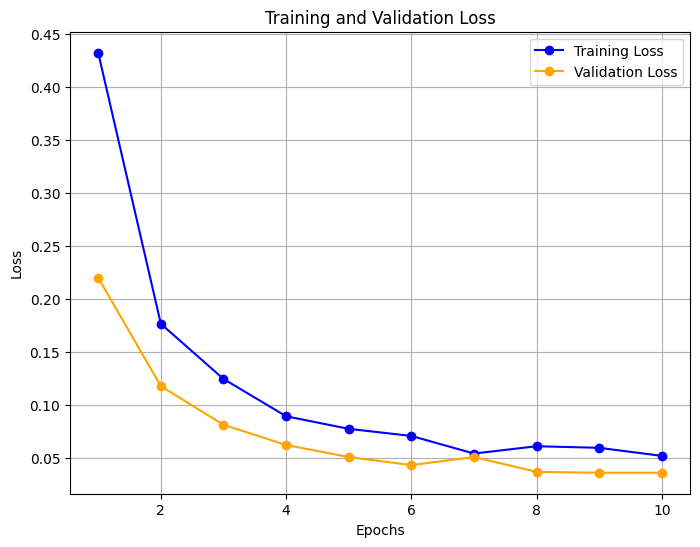

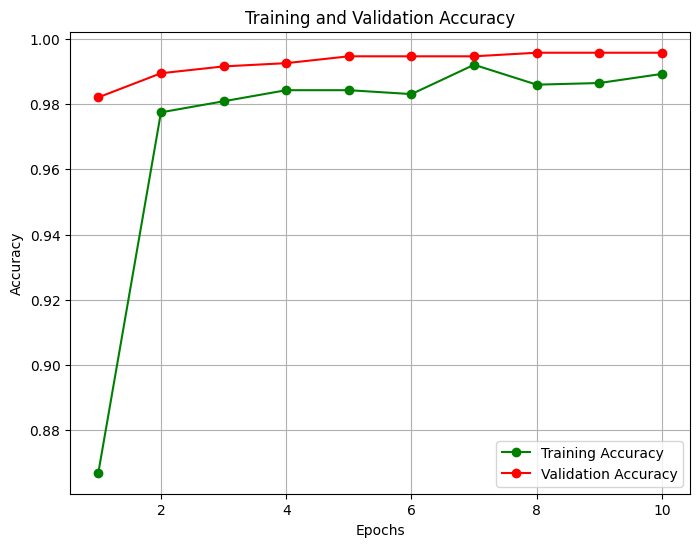

In [17]:
import matplotlib.pyplot as plt

# Training and validation loss and accuracy values (from your provided results)
train_losses = [0.4325, 0.1767, 0.1247, 0.0895, 0.0776, 0.0709, 0.0543, 0.0612, 0.0597, 0.0521]
val_losses = [0.2202, 0.1179, 0.0814, 0.0624, 0.0510, 0.0434, 0.0510, 0.0370, 0.0362, 0.0362]
train_accs = [0.8669, 0.9775, 0.9809, 0.9843, 0.9843, 0.9831, 0.9921, 0.9860, 0.9865, 0.9893]
val_accs = [0.9821, 0.9895, 0.9916, 0.9926, 0.9947, 0.9947, 0.9947, 0.9958, 0.9958, 0.9958]

# Function to plot training and validation loss
def plot_loss(train_losses, val_losses):
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(8, 6))
    plt.plot(epochs, train_losses, label='Training Loss', color='blue', marker='o')
    plt.plot(epochs, val_losses, label='Validation Loss', color='orange', marker='o')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to plot training and validation accuracy
def plot_accuracy(train_accs, val_accs):
    epochs = range(1, len(train_accs) + 1)
    plt.figure(figsize=(8, 6))
    plt.plot(epochs, train_accs, label='Training Accuracy', color='green', marker='o')
    plt.plot(epochs, val_accs, label='Validation Accuracy', color='red', marker='o')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

# Call the functions to plot the loss and accuracy curves
plot_loss(train_losses, val_losses)
plot_accuracy(train_accs, val_accs)

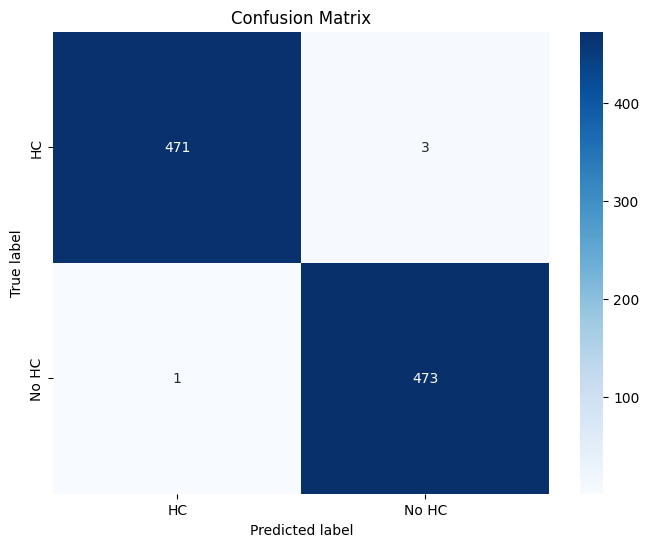

Classification Report:
              precision    recall  f1-score   support

          HC       1.00      0.99      1.00       474
       No HC       0.99      1.00      1.00       474

    accuracy                           1.00       948
   macro avg       1.00      1.00      1.00       948
weighted avg       1.00      1.00      1.00       948



In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

# Function to plot confusion matrix
def plot_confusion_matrix(cm, classes, title='Confusion Matrix', cmap=plt.cm.Blues):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Evaluate the model and calculate metrics
vgg19_model.eval()
y_true = []
y_pred = []
with torch.no_grad():
    for inputs, labels in dataloaders['valid']:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = vgg19_model(inputs)
        _, preds = torch.max(outputs, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm, class_names)

# Classification report
print('Classification Report:')
print(classification_report(y_true, y_pred, target_names=class_names))

# Loss graph
def plot_loss(train_losses, val_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

In [20]:
from sklearn.metrics import f1_score, recall_score

# Calculate F1 score and Recall
f1 = f1_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')

print(f'F1 Score: {f1:.4f}')
print(f'Recall: {recall:.4f}')

F1 Score: 0.9958
Recall: 0.9958


In [21]:
val_loader = dataloaders['valid']
mean_nums = [0.485, 0.456, 0.406]
std_nums = [0.229, 0.224, 0.225]

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array(mean_nums)
    std = np.array(std_nums)
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)

In [22]:
def visualize_predictions(model, num_images=25):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(15, 10))

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size(0)):
                images_so_far += 1
                ax = plt.subplot(num_images // 2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}, true: {class_names[labels[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
    model.train(mode=was_training)

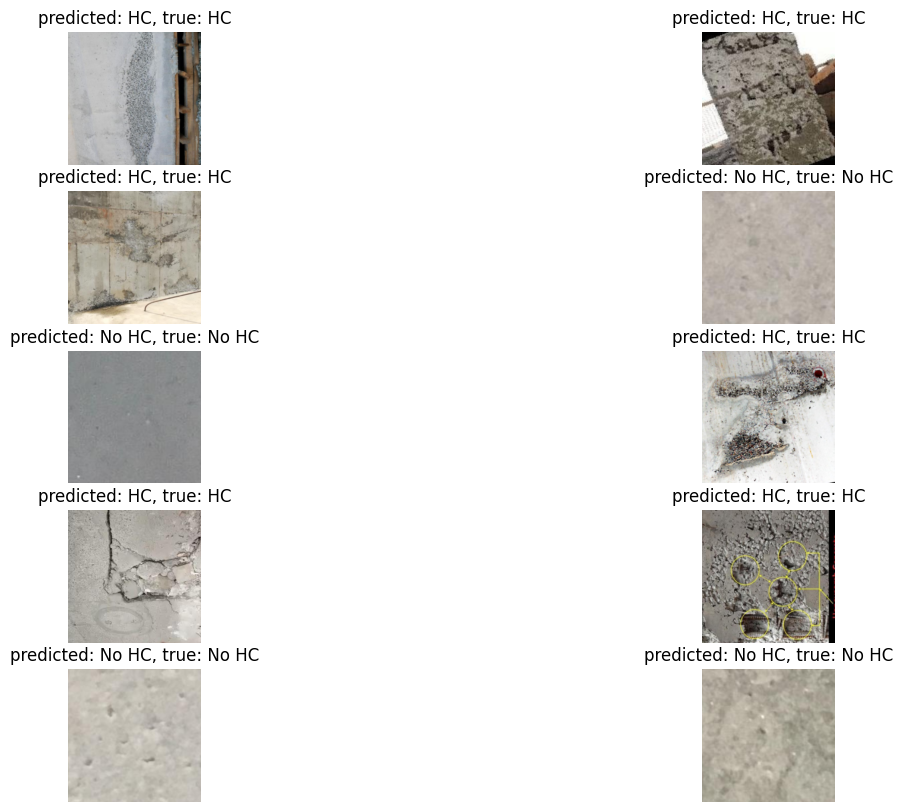

In [23]:
visualize_predictions(vgg19_model, num_images=10)

Crack detected in 271_jpg.rf.4a847d52f58abc7e5a03ace2c27ed167.jpg


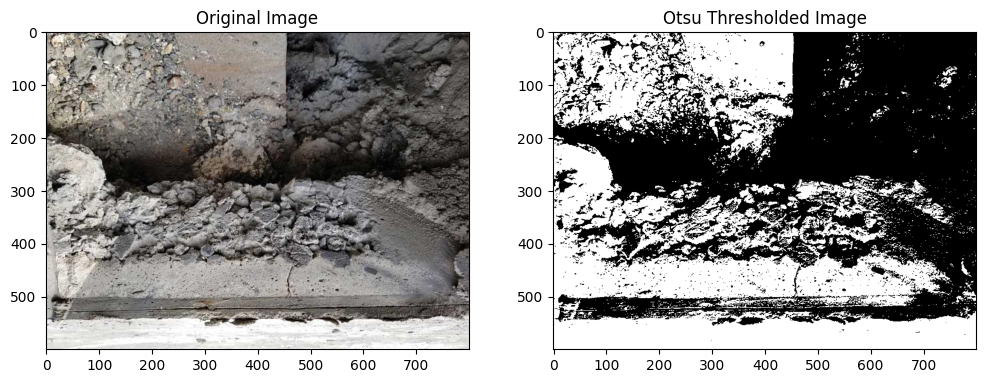

Estimated crack width: 195.00 mm
Crack detected in 1296_jpg.rf.59162017be8ad6ceb142b96c2ae7023e.jpg


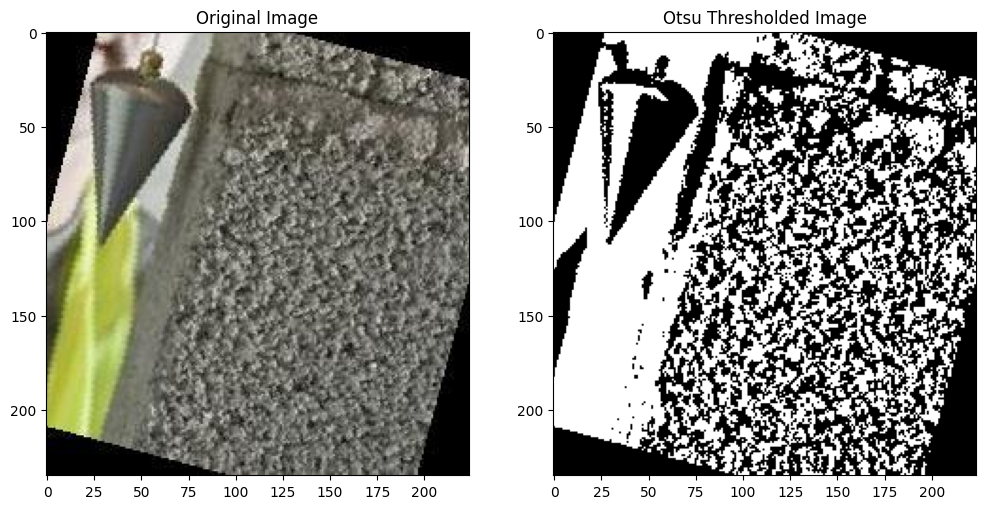

Estimated crack width: 47.36 mm
Crack detected in 451_jpg.rf.a312510ccab9de0d154e774da3dbf682.jpg


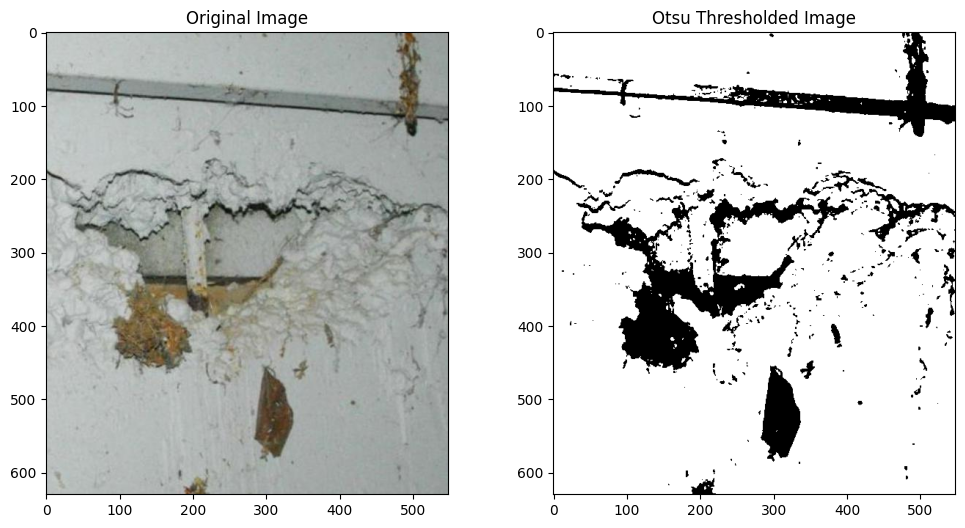

Estimated crack width: 81.23 mm
Crack detected in 1405_jpg.rf.c159b6aae417f4d153e9c8068392eb88.jpg


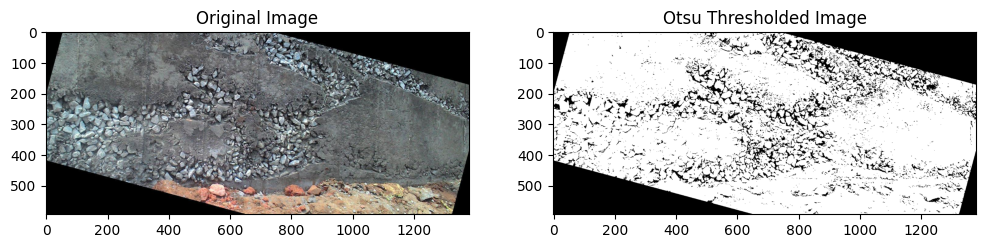

Estimated crack width: 194.20 mm
Crack detected in 524_jpg.rf.da90da92a39c81b023d78ee3c35de10c.jpg


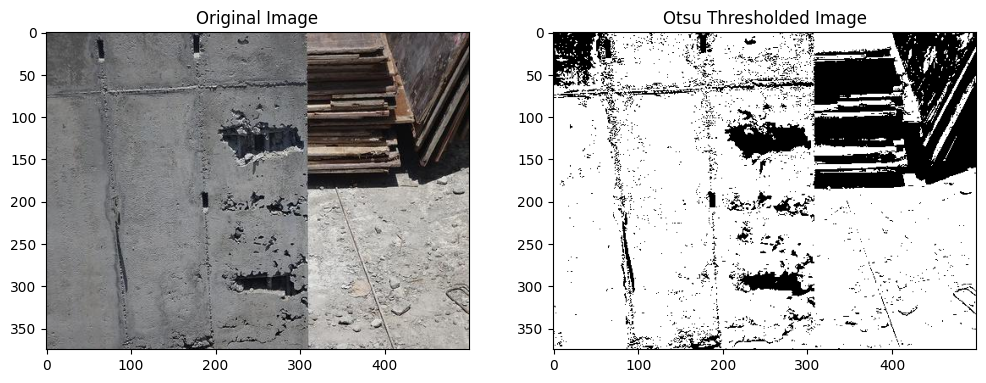

Estimated crack width: 83.08 mm
Crack detected in 883_jpg.rf.94d23fc48c8da0cf0fe93ad809b48f55.jpg


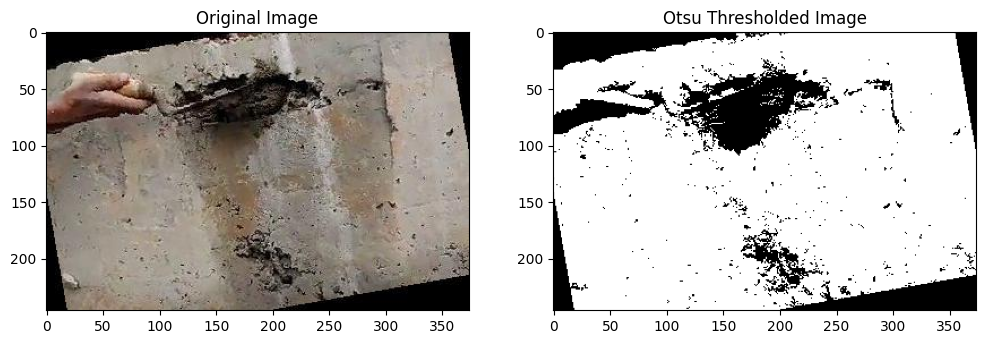

Estimated crack width: 55.30 mm
Crack detected in 300_jpg.rf.2b9f10e1ca551c6b0f0a33f9e99528bd.jpg


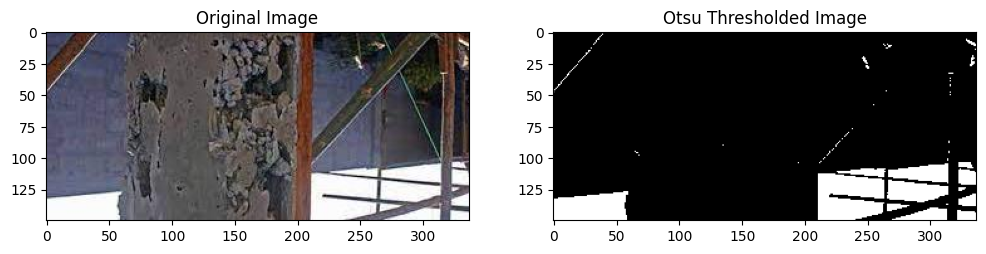

Estimated crack width: 89.16 mm
Crack detected in 265_jpg.rf.a3b2e7f8ec26335a232ee3db5c6b30dd.jpg


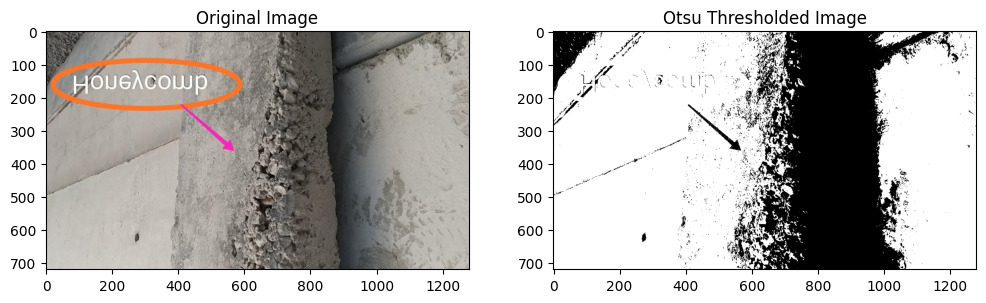

Estimated crack width: 146.84 mm
Crack detected in 355_jpg.rf.77c98ae08996e27563e3a2f0dc76e081.jpg


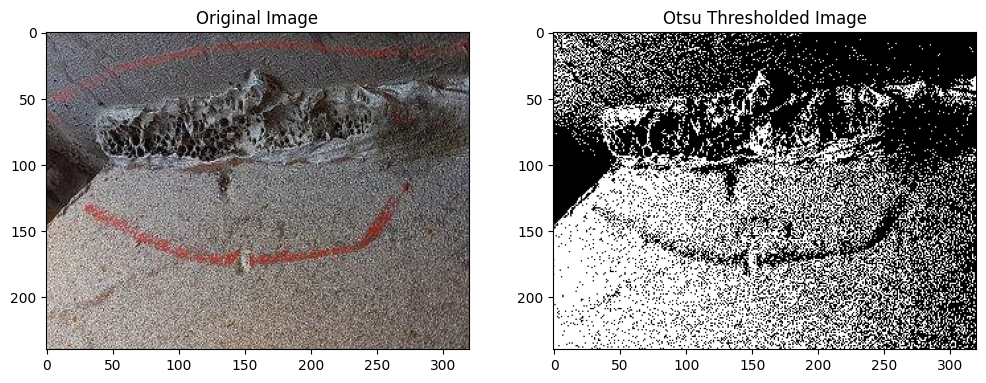

Estimated crack width: 73.29 mm
Accuracy of crack detection: 100.00%


In [25]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms

# Example conversion factor: 1 pixel = 0.264583 mm (assuming 96 PPI)
pixels_to_mm = 0.264583

def apply_otsu_thresholding(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    _, thresh_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    thresh_image = cv2.cvtColor(thresh_image, cv2.COLOR_GRAY2RGB)
    return Image.fromarray(thresh_image)

def predict_image(model, image_path):
    model.eval()
    image = apply_otsu_thresholding(image_path)
    image_tensor = chosen_transforms['val'](image).unsqueeze(0).to(device)
    outputs = model(image_tensor)
    _, predicted = torch.max(outputs, 1)
    return class_names[predicted[0].item()]

def monitor_images(model, image_dir, threshold=0.5):
    model.eval()
    images = os.listdir(image_dir)
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean_nums, std_nums)
    ])

    total_images = 0
    cracked_images = 0

    for image_name in images:
        image_path = os.path.join(image_dir, image_name)
        if os.path.isdir(image_path):
            continue

        image = Image.open(image_path)
        image = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(image)
            _, preds = torch.max(outputs, 1)
            prediction = preds.item()
            total_images += 1

            if prediction == 0:
                cracked_images += 1
                print(f"Crack detected in {image_name}")
                otsu_image = apply_otsu_thresholding(image_path)
                fig, ax = plt.subplots(1, 2, figsize=(12, 6))
                ax[0].imshow(Image.open(image_path))
                ax[0].set_title('Original Image')
                ax[1].imshow(otsu_image)
                ax[1].set_title('Otsu Thresholded Image')
                plt.show()

                gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                _, binary_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
                crack_width = np.sum(binary_image == 0, axis=1).max()
                crack_width_mm = crack_width * pixels_to_mm
                print(f"Estimated crack width: {crack_width_mm:.2f} mm")

                if crack_width_mm > threshold:
                    print("Warning: Crack width exceeds threshold!")

    accuracy = cracked_images / total_images * 100 if total_images > 0 else 0
    print(f"Accuracy of crack detection: {accuracy:.2f}%")

def measure_crack_dimensions(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    _, binary_image = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary_image = cv2.bitwise_not(binary_image)
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    max_width = 0
    max_height = 0

    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if w > max_width:
            max_width = w
        if h > max_height:
            max_height = h

    max_width_mm = max_width * pixels_to_mm
    max_height_mm = max_height * pixels_to_mm
    return max_width_mm, max_height_mm

# Example call to the monitor_images function
monitor_images(vgg19_model, '/kaggle/input/honeycombing-without-lebel-files/Honey Combing Without lebel/test/HC')

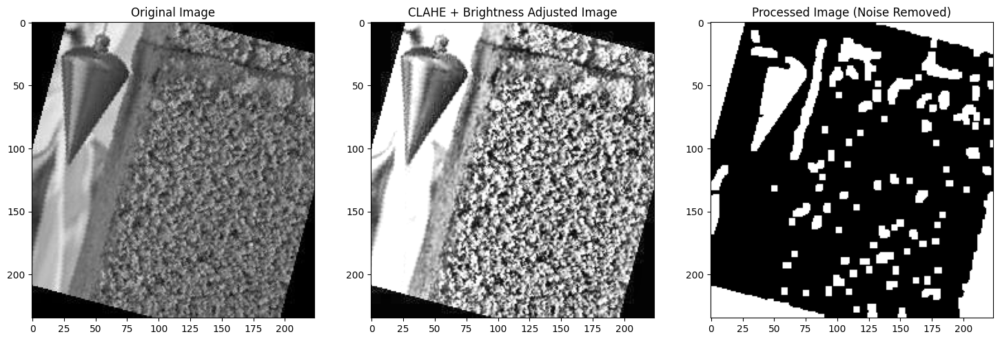

Estimated HoneyCombing: 3.96 mm


In [27]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def process_crack_image(image_path, pixel_to_mm_ratio=0.1, crack_threshold=50, brightness_factor=1.0, clip_limit=2.0, grid_size=(8, 8)):
    # Load image in grayscale
    gray_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image was loaded correctly
    if gray_img is None:
        print(f"Error: Could not load image at {image_path}. Please check the file path.")
        return
    
    # Apply brightness adjustment (brightness_factor > 1 increases brightness, < 1 decreases)
    bright_img = cv2.convertScaleAbs(gray_img, alpha=brightness_factor, beta=0)
    
    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=grid_size)
    clahe_img = clahe.apply(bright_img)
    
    # Apply Gaussian Blur to reduce noise
    blurred_img = cv2.GaussianBlur(clahe_img, (5, 5), 0)
    
    # Apply Otsu's thresholding
    _, binary_img = cv2.threshold(blurred_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Morphological Opening to remove small noise
    kernel = np.ones((5, 5), np.uint8)
    opened_img = cv2.morphologyEx(binary_img, cv2.MORPH_OPEN, kernel)
    
    # Find contours of the cracks
    contours, _ = cv2.findContours(opened_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Draw the contours on the original image (optional)
    result_img = cv2.cvtColor(gray_img, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(result_img, contours, -1, (0, 255, 0), 2)

    # Display the original and processed images
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))
    ax[0].imshow(cv2.cvtColor(gray_img, cv2.COLOR_GRAY2RGB))
    ax[0].set_title('Original Image')
    ax[1].imshow(clahe_img, cmap='gray')
    ax[1].set_title('CLAHE + Brightness Adjusted Image')
    ax[2].imshow(opened_img, cmap='gray')
    ax[2].set_title('Processed Image (Noise Removed)')
    plt.show()

    # Estimate crack width
    max_width = max([cv2.boundingRect(contour)[2] for contour in contours]) * pixel_to_mm_ratio
    print(f"Estimated HoneyCombing: {max_width:.2f} mm")
    
    if max_width > crack_threshold:
        print("Warning: HoneyCombing exceeds threshold!")

# Example usage
image_path = '/kaggle/input/honeycombing-without-lebel-files/Honey Combing Without lebel/test/HC/129_jpg.rf.59162017be8ad6ceb142b96c2ae7023e.jpg'  # Make sure the path is correct

# You can adjust the brightness, CLAHE clip limit, and tile grid size
brightness_factor = 1.6  # Controls brightness (1.0 is no change)
clip_limit = 3.0  # Higher values increase contrast (default is 2.0)
grid_size = (8, 8)  # Adjust grid size for CLAHE (default is 8x8)

process_crack_image(image_path, pixel_to_mm_ratio=0.04260, brightness_factor=brightness_factor, clip_limit=clip_limit, grid_size=grid_size)